In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

import random
# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os

#for dirname, _, filenames in os.walk('/kaggle/input'):
#    for filename in filenames:
#        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# Exploratory Analysis
The goal is to extract as much useful information as possible in a structured manner from the data. Split the code across multiple cells.
NOTE: Perform the steps on input features, targets and on the relationship between inputs/targets and within inputs
Check competition discussions. The dataset is just been updated so we can use existing methods to compre the difference in results
- View data distributions, amount of missing data etc and get discriptive statistics
- Identify skewed features and outliers
- Identify correlations between features and with targets (inputs most correlated to target, inputs correlated to each other which become redundant etc)
- Perform feaure selection based on above factors and other external knowledge
- Get feature importance scores after fitting an ML model like XGBoost on data

### 1. Load and Visualize Data

Let's start by loading your entire dataset or a sample if it is a larger dataset.

NOTE: We have 2 data sources, images and a csv file with a rows of auxillary data corresponding to each image. 

## For CSV data

In [13]:
train_csv = pd.read_csv('/kaggle/input/planttraits2024/train.csv')
test_csv = pd.read_csv('/kaggle/input/planttraits2024/test.csv')

In [14]:
len(test_csv)

6545

In [15]:
#Get the number of train and test images
import fnmatch
train_img_dir = '/kaggle/input/planttraits2024/train_images/'
test_img_dir = '/kaggle/input/planttraits2024/test_images/'

print("Training images: ",len(fnmatch.filter(os.listdir(train_img_dir), '*.jpeg')))
print("Testing images: ",len(fnmatch.filter(os.listdir(test_img_dir), '*.jpeg')))

Training images:  55489
Testing images:  7133


In [16]:
#Get just the targets in a separate df
train_csv['image_path'] = f'/kaggle/input/planttraits2024/train_images/'+train_csv['id'].astype(str)+'.jpeg'
target_name = pd.read_csv("/kaggle/input/planttraits2024/target_name_meta.tsv", delimiter='\t')

#only the output targets to be predicted
y_columns = ['id', 'image_path']
y_columns += [col for col in train_csv.columns if col.endswith('_mean')]

target = train_csv[y_columns]

In [17]:
#This shows the desription of the output variables
target_name

,trait_ID,trait_name
0,X4,Stem specific density (SSD) or wood density (s...
1,X11,Leaf area per leaf dry mass (specific leaf are...
2,X18,Plant height
3,X26,Seed dry mass
4,X50,Leaf nitrogen (N) content per leaf area
5,X3112,"Leaf area (in case of compound leaves: leaf, u..."


**Description of the target variables**
<br>
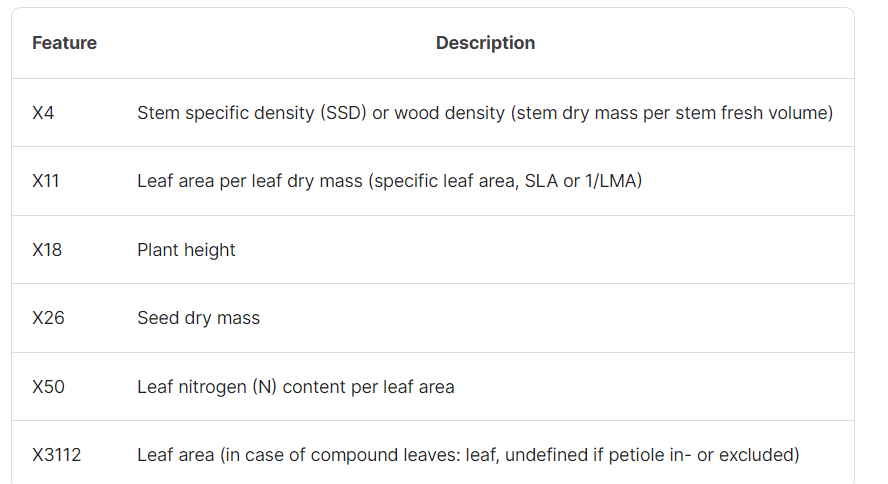

Provide some visualization of the data. For example,
- If your data is time series, you can plot a sequence and the response or label.
- If tabular data, you can plot histograms of the data.
- If working with image recognition or segmentation, you can show an image and the corresponding output.
- If it is a video that you are processing, just show screenshots.
- If doing something with reinforcement learning, you can provide samples of the simulation environment used.

id=  193613930
Output:                id                                         image_path  X4_mean  \
17048  193613930  /kaggle/input/planttraits2024/train_images/193...  0.39294   

        X11_mean  X18_mean  X26_mean  X50_mean  X3112_mean  
17048  16.756725  0.316583  0.972624  1.164608   30.177313  


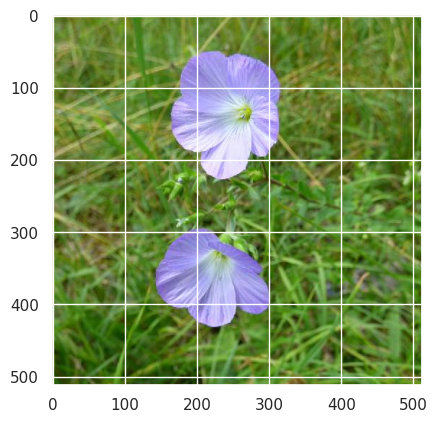

In [24]:
#Print a sample train image

random_image = random.choice([x for x in os.listdir(train_img_dir)
               if os.path.isfile(os.path.join(train_img_dir, x))])
img_name = train_img_dir+random_image
print("id= ",random_image[:-5])
print("Output: ",target[(target.id == int(random_image[:-5]))])
img = mpimg.imread(img_name)
imgplot = plt.imshow(img)
plt.show()


In [22]:
target.head()

,id,image_path,X4_mean,X11_mean,X18_mean,X26_mean,X50_mean,X3112_mean
0,192027691,/kaggle/input/planttraits2024/train_images/192...,0.401753,11.758108,0.117484,1.243779,1.849375,50.216034
1,195542235,/kaggle/input/planttraits2024/train_images/195...,0.480334,15.748846,0.389315,0.642940,1.353468,574.098472
2,196639184,/kaggle/input/planttraits2024/train_images/196...,0.796917,5.291251,8.552908,0.395241,2.343153,1130.096731
3,195728812,/kaggle/input/planttraits2024/train_images/195...,0.525236,9.568305,1.083629,0.154200,1.155308,1042.686546
4,195251545,/kaggle/input/planttraits2024/train_images/195...,0.411821,14.528877,0.657585,10.919966,2.246226,2386.467180


### 2. Compute Some Statistics from your Data

First, extract some characterisitics about the input (e.g., image size, means and standard deviation of values, sample frequency).

In [26]:
#image shape
img.shape

(512, 512, 3)

In [27]:
#Display the number of rows and columns of data
print("Train shape: ",train_csv.shape)
print("Test shape: ",test_csv.shape)

Train shape:  (55489, 177)
Test shape:  (6545, 164)


In [28]:
#Statistics of output variables
target.describe()

,id,X4_mean,X11_mean,X18_mean,X26_mean,X50_mean,X3112_mean
count,5.548900e+04,55489.000000,5.548900e+04,5.548900e+04,5.548900e+04,55489.000000,5.548900e+04
mean,1.714553e+08,0.522575,1.325267e+02,1.969902e+04,3.459399e+03,13.528574,3.975552e+05
std,4.087868e+07,0.174853,1.278220e+04,2.309747e+06,2.471919e+05,1356.480785,9.152463e+07
min,2.637500e+04,-2.431157,6.780000e-05,2.330000e-08,5.500000e-07,0.000097,7.690000e-08
25%,1.658614e+08,0.410995,1.063987e+01,3.102831e-01,5.613414e-01,1.173489,2.552815e+02
50%,1.915103e+08,0.509009,1.511232e+01,7.156651e-01,2.519985e+00,1.480060,7.244318e+02
75%,1.951001e+08,0.622383,1.968160e+01,3.586311e+00,1.491886e+01,1.926343,2.148630e+03
max,1.967668e+08,4.475172,1.504254e+06,2.720494e+08,3.106555e+07,159759.897700,2.155911e+10


In [29]:
#Check if there are Nulls in output columns
target.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55489 entries, 0 to 55488
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   id          55489 non-null  int64  
 1   image_path  55489 non-null  object 
 2   X4_mean     55489 non-null  float64
 3   X11_mean    55489 non-null  float64
 4   X18_mean    55489 non-null  float64
 5   X26_mean    55489 non-null  float64
 6   X50_mean    55489 non-null  float64
 7   X3112_mean  55489 non-null  float64
dtypes: float64(6), int64(1), object(1)
memory usage: 3.4+ MB


Next, provide some characteristics about your output (e.g., histograms, spatial distribution of bounding boxes in the case of object detection, etc.). In the case of cases such as tasks such as reinforcement learning, you can provide details about the desired output and rewards used. You can show some correlations between inputs and outputs if possible.

## Analysing each output variable

In [31]:
#import pandas_bokeh
#pandas_bokeh.output_notebook()
#pd.set_option('plotting.backend', 'pandas_bokeh')
# Create Bokeh-Table with DataFrame:
from bokeh.models.widgets import DataTable, TableColumn
from bokeh.models import ColumnDataSource
from bokeh.plotting import figure, output_file, show

from bokeh.resources import INLINE
import bokeh.io
bokeh.io.output_notebook(INLINE)

Loading BokehJS ...

### X4_mean
- Stem Specific Density (SSD) - quantifies woodiness and stem-water content
- Values below 0 are anomalies and need to be ignored during training

In [32]:
#Get the number of negative values
print("Column description: ",target['X4_mean'].describe())
print()
print("Number of NaN values if any: ",target['X4_mean'].isnull().sum())
print("Number of negative values: ",len(target[target['X4_mean']<0]))
print("Number of value > 1: ",len(target[target['X4_mean'] > 1]))

Column description:  count    55489.000000
mean         0.522575
std          0.174853
min         -2.431157
25%          0.410995
50%          0.509009
75%          0.622383
max          4.475172
Name: X4_mean, dtype: float64

Number of NaN values if any:  0
Number of negative values:  155
Number of value > 1:  179


In [33]:
#Plot X4_mean
graph = figure(title = "Bokeh Scatter Graph")
graph.scatter(target.index,target['X4_mean'])
show(graph)

Text(0.5, 1.0, 'Histogram of X4_mean')

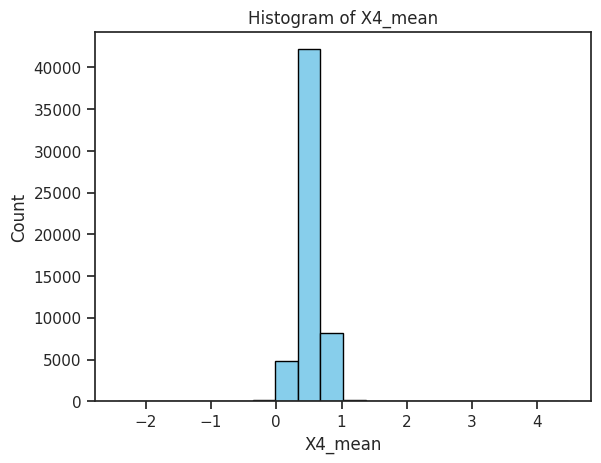

In [34]:
#Histogram to get distribution
plt.hist(target['X4_mean'], bins=20, color='skyblue', edgecolor='black')
plt.xlabel('X4_mean')
plt.ylabel('Count')
plt.title('Histogram of X4_mean')

### X11_mean
-  Specific Leaf Area - is the ratio of leaf area to leaf dry mass
- There are only 132 values > 100 and 65 values below 1 to consider

In [35]:
#Get the number of negative values
print("Column description: ",target['X11_mean'].describe())
print()
print("Number of NaN values if any: ",target['X11_mean'].isnull().sum())
print("Number of values < 1: ",len(target[target['X11_mean']<1]))
print("Number of value > 200: ",len(target[target['X11_mean'] > 200]))

Column description:  count    5.548900e+04
mean     1.325267e+02
std      1.278220e+04
min      6.780000e-05
25%      1.063987e+01
50%      1.511232e+01
75%      1.968160e+01
max      1.504254e+06
Name: X11_mean, dtype: float64

Number of NaN values if any:  0
Number of values < 1:  65
Number of value > 200:  88


In [36]:
#Plot X11_mean
graph = figure(title = "Bokeh Scatter Graph")
graph.scatter(target.index,target['X11_mean'])
show(graph)

Text(0.5, 1.0, 'Histogram of X11_mean')

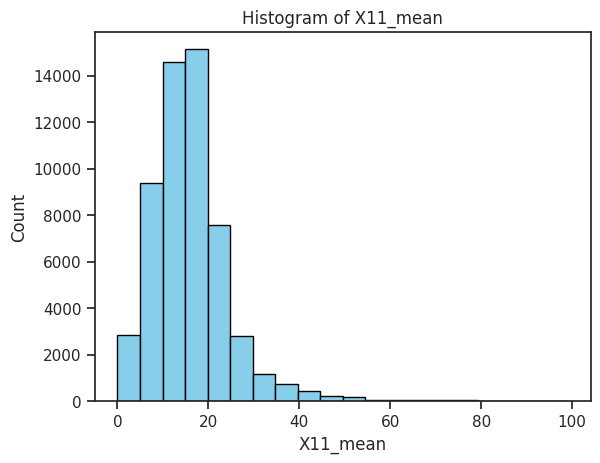

In [37]:
#Histogram to get distribution
plt.hist(target[target['X11_mean']<100].X11_mean, bins=20, color='skyblue', edgecolor='black')
plt.xlabel('X11_mean')
plt.ylabel('Count')
plt.title('Histogram of X11_mean')

### X18_mean
- Plant height - The distance from the base of the plant at ground level to the top of the highest leaf
- There are only 61 values > 100. Most seems to be less than 1

In [38]:
#Get the number of negative values
print("Column description: ",target['X18_mean'].describe())
print()
print("Number of NaN values if any: ",target['X18_mean'].isnull().sum())
print("Number of values < 1: ",len(target[target['X18_mean']<1]))
print("Number of value > 100: ",len(target[target['X18_mean'] > 100]))

Column description:  count    5.548900e+04
mean     1.969902e+04
std      2.309747e+06
min      2.330000e-08
25%      3.102831e-01
50%      7.156651e-01
75%      3.586311e+00
max      2.720494e+08
Name: X18_mean, dtype: float64

Number of NaN values if any:  0
Number of values < 1:  31743
Number of value > 100:  61


In [39]:
#Plot X18_mean
graph = figure(title = "Bokeh Scatter Graph")
graph.scatter(target.index,target['X18_mean'])
show(graph)

Text(0.5, 1.0, 'Histogram of X18_mean')

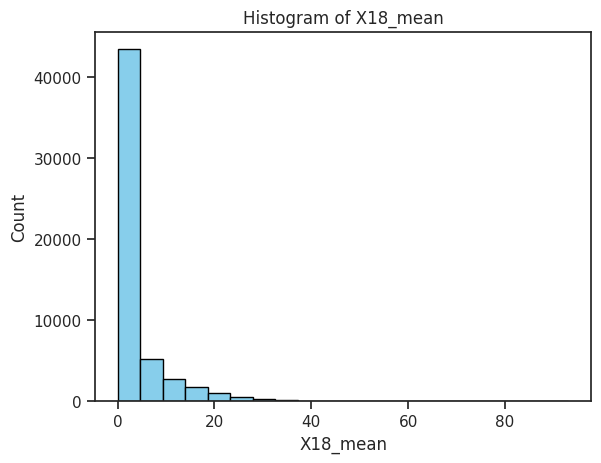

In [40]:
#Histogram to get distribution
plt.hist(target[target['X18_mean']<100].X18_mean, bins=20, color='skyblue', edgecolor='black')
plt.xlabel('X18_mean')
plt.ylabel('Count')
plt.title('Histogram of X18_mean')

### X26_mean
- Seed dry mass - is the oven-dry mass of an average seed of a species

In [41]:
#Get the number of negative values
print("Column description: ",target['X26_mean'].describe())
print()
print("Number of NaN values if any: ",target['X26_mean'].isnull().sum())
print("Number of values < 1: ",len(target[target['X26_mean']<1]))
print("Number of value > 5000: ",len(target[target['X26_mean'] > 5000]))

Column description:  count    5.548900e+04
mean     3.459399e+03
std      2.471919e+05
min      5.500000e-07
25%      5.613414e-01
50%      2.519985e+00
75%      1.491886e+01
max      3.106555e+07
Name: X26_mean, dtype: float64

Number of NaN values if any:  0
Number of values < 1:  18743
Number of value > 5000:  142


In [42]:
#Plot X26_mean
graph = figure(title = "Bokeh Scatter Graph")
graph.scatter(target.index,target['X26_mean'])
show(graph)

Text(0.5, 1.0, 'Histogram of X26_mean')

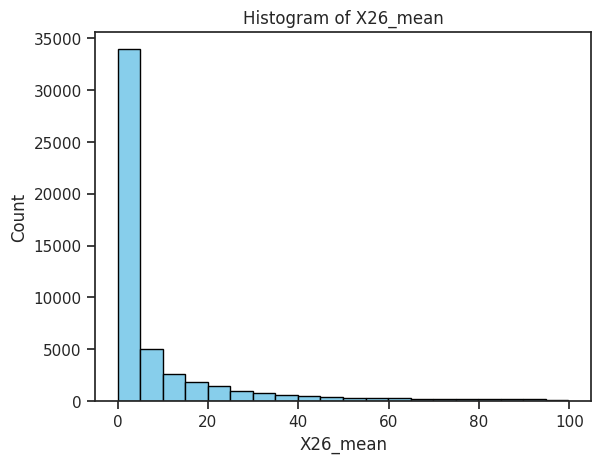

In [43]:
#Histogram to get distribution
plt.hist(target[target['X26_mean']<100].X26_mean, bins=20, color='skyblue', edgecolor='black')
plt.xlabel('X26_mean')
plt.ylabel('Count')
plt.title('Histogram of X26_mean')

### X50_mean
- Leaf nitrogen (N) content per leaf area

In [44]:
#Get the number of negative values
print("Column description: ",target['X50_mean'].describe())
print()
print("Number of NaN values if any: ",target['X50_mean'].isnull().sum())
print("Number of values < 1: ",len(target[target['X50_mean']<1]))
print("Number of value > 10: ",len(target[target['X50_mean'] > 10]))

Column description:  count     55489.000000
mean         13.528574
std        1356.480785
min           0.000097
25%           1.173489
50%           1.480060
75%           1.926343
max      159759.897700
Name: X50_mean, dtype: float64

Number of NaN values if any:  0
Number of values < 1:  7913
Number of value > 10:  112


In [45]:
#Plot X50_mean
graph = figure(title = "Bokeh Scatter Graph")
graph.scatter(target.index,target['X50_mean'])
show(graph)

Text(0.5, 1.0, 'Histogram of X50_mean')

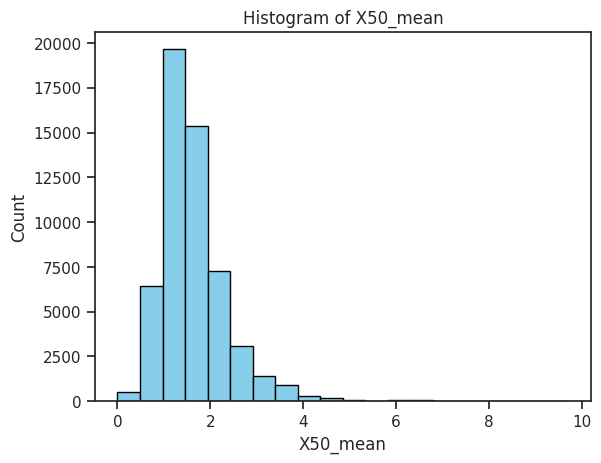

In [46]:
#Histogram to get distribution
plt.hist(target[target['X50_mean']<10].X50_mean, bins=20, color='skyblue', edgecolor='black')
plt.xlabel('X50_mean')
plt.ylabel('Count')
plt.title('Histogram of X50_mean')

### X3112_mean
- Leaf area

In [47]:
#Get the number of negative values
print("Column description: ",target['X3112_mean'].describe())
print()
print("Number of NaN values if any: ",target['X3112_mean'].isnull().sum())
print("Number of values < 1: ",len(target[target['X3112_mean']<1]))
print("Number of value > 20000: ",len(target[target['X3112_mean'] > 20000]))

Column description:  count    5.548900e+04
mean     3.975552e+05
std      9.152463e+07
min      7.690000e-08
25%      2.552815e+02
50%      7.244318e+02
75%      2.148630e+03
max      2.155911e+10
Name: X3112_mean, dtype: float64

Number of NaN values if any:  0
Number of values < 1:  48
Number of value > 20000:  779


In [48]:
#Plot X50_mean
graph = figure(title = "Bokeh Scatter Graph")
graph.scatter(target.index,target['X3112_mean'])
show(graph)

Text(0.5, 1.0, 'Histogram of X3112_mean')

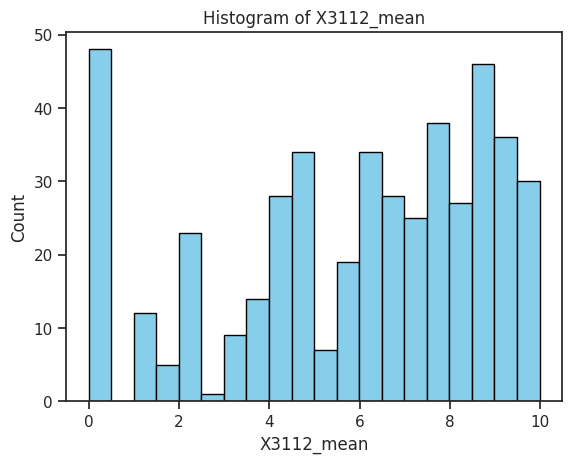

In [49]:
#Histogram to get distribution
plt.hist(target[target['X3112_mean']<10].X3112_mean, bins=20, color='skyblue', edgecolor='black')
plt.xlabel('X3112_mean')
plt.ylabel('Count')
plt.title('Histogram of X3112_mean')

In [50]:
#Check if targets are correlated to each other
target.drop(['id', 'image_path'], axis=1).corr()

,X4_mean,X11_mean,X18_mean,X26_mean,X50_mean,X3112_mean
X4_mean,1.000000,-0.023707,0.072643,0.103449,0.017680,-0.001856
X11_mean,-0.023707,1.000000,0.000080,-0.000070,-0.000102,-0.000043
X18_mean,0.072643,0.000080,1.000000,0.000874,-0.000084,0.000220
X26_mean,0.103449,-0.000070,0.000874,1.000000,0.000908,-0.000060
X50_mean,0.017680,-0.000102,-0.000084,0.000908,1.000000,0.000696
X3112_mean,-0.001856,-0.000043,0.000220,-0.000060,0.000696,1.000000


In [51]:
test_csv.head()

,id,WORLDCLIM_BIO1_annual_mean_temperature,WORLDCLIM_BIO12_annual_precipitation,WORLDCLIM_BIO13.BIO14_delta_precipitation_of_wettest_and_dryest_month,WORLDCLIM_BIO15_precipitation_seasonality,WORLDCLIM_BIO4_temperature_seasonality,WORLDCLIM_BIO7_temperature_annual_range,SOIL_bdod_0.5cm_mean_0.01_deg,SOIL_bdod_100.200cm_mean_0.01_deg,SOIL_bdod_15.30cm_mean_0.01_deg,...,VOD_X_1997_2018_multiyear_mean_m03,VOD_X_1997_2018_multiyear_mean_m04,VOD_X_1997_2018_multiyear_mean_m05,VOD_X_1997_2018_multiyear_mean_m06,VOD_X_1997_2018_multiyear_mean_m07,VOD_X_1997_2018_multiyear_mean_m08,VOD_X_1997_2018_multiyear_mean_m09,VOD_X_1997_2018_multiyear_mean_m10,VOD_X_1997_2018_multiyear_mean_m11,VOD_X_1997_2018_multiyear_mean_m12
0,201238668,8.086756,2246.500000,127.321426,20.423418,353.381042,17.535713,80,109,90,...,0.385838,0.389460,0.387536,0.374910,0.363712,0.364623,0.379435,0.388294,0.398887,0.397853
1,202310319,10.844286,495.871429,28.023809,18.738306,786.554382,29.292856,130,155,142,...,0.279171,0.300813,0.332776,0.314386,0.291168,0.280947,0.277623,0.276503,0.271212,0.272672
2,202604412,8.105556,378.328583,39.928570,41.885647,722.071167,34.853809,133,134,139,...,0.392073,0.418509,0.437172,0.453239,0.445230,0.435441,0.432758,0.429839,0.417250,0.394216
3,201353439,7.077679,878.785706,70.428574,37.045235,669.389343,25.150000,103,140,116,...,0.384626,0.313667,0.352311,0.401131,0.513455,0.519174,0.474007,0.469071,0.408466,0.366724
4,195351745,4.790555,2299.366699,150.199997,24.136568,462.887695,22.516666,85,114,98,...,0.515619,0.506952,0.462181,0.397052,0.358262,0.369279,0.414420,0.469002,0.519534,0.521837


In [52]:
#split columns
x_columns = [col for col in train_csv.columns if not col.endswith('_mean')]
x_columns.remove('image_path')
x_columns.remove('id')
x_columns = x_columns[:-6]
y_cols = [col for col in train_csv.columns if col.endswith('_mean')]

#Remove rows with basic outliers
train = train_csv[(train_csv['X4_mean']>0)&(train_csv['X11_mean']<=100)& (train_csv['X18_mean'] < 100) & (train_csv['X26_mean'] < 5000) & (train_csv['X50_mean'] < 10) & (train_csv['X3112_mean']<21000)]
#train = train_csv
image_paths = train['image_path']
X_train = train[x_columns]
y_train = train[y_cols]
X_test = test_csv.copy()
X_test.drop(['id'],axis=1,inplace=True)

In [53]:
print(image_paths.shape)
print(image_paths.head())

(54421,)
0    /kaggle/input/planttraits2024/train_images/192...
1    /kaggle/input/planttraits2024/train_images/195...
2    /kaggle/input/planttraits2024/train_images/196...
3    /kaggle/input/planttraits2024/train_images/195...
4    /kaggle/input/planttraits2024/train_images/195...
Name: image_path, dtype: object


### Input columns
The input features, are broadly split into 4 categories:
- WORLDCLIM_BIO[*] - These are ancillary climate variables that can be used to faciliate the trait prediction. The selection is based on Schiller et al. 2021.
- SOIL_[*]- These are ancillary soil variables that can be used to faciliate the trait prediction.
- MODIS_[*]/VOD_[*]- These are ancillary multitemporal satellite variables that can be used to faciliate the trait prediction (details see below).

As there are a lot of features with some features being highly correlated with each other, we run PCA to perform dimensionality reduction

In [54]:
#Input Columns
x_columns = []
x_columns += [col for col in train_csv.columns if not col.endswith('_mean')]
input = train_csv[x_columns]
input.head()

,id,WORLDCLIM_BIO1_annual_mean_temperature,WORLDCLIM_BIO12_annual_precipitation,WORLDCLIM_BIO13.BIO14_delta_precipitation_of_wettest_and_dryest_month,WORLDCLIM_BIO15_precipitation_seasonality,WORLDCLIM_BIO4_temperature_seasonality,WORLDCLIM_BIO7_temperature_annual_range,SOIL_bdod_0.5cm_mean_0.01_deg,SOIL_bdod_100.200cm_mean_0.01_deg,SOIL_bdod_15.30cm_mean_0.01_deg,...,VOD_X_1997_2018_multiyear_mean_m10,VOD_X_1997_2018_multiyear_mean_m11,VOD_X_1997_2018_multiyear_mean_m12,X4_sd,X11_sd,X18_sd,X26_sd,X50_sd,X3112_sd,image_path
0,192027691,12.235703,374.466675,62.524445,72.256844,773.592041,33.277779,125,149,136,...,0.472432,0.448272,0.403038,0.008921,1.601473,0.025441,0.153608,0.279610,15.045054,/kaggle/input/planttraits2024/train_images/192...
1,195542235,17.270555,90.239998,10.351111,38.220940,859.193298,40.009777,124,144,138,...,0.279112,0.294724,0.311158,0.003102,0.258078,0.000866,0.034630,0.010165,11.004477,/kaggle/input/planttraits2024/train_images/195...
2,196639184,14.254504,902.071411,49.642857,17.873655,387.977753,22.807142,107,133,119,...,0.455066,0.458448,0.455440,NaN,NaN,NaN,NaN,NaN,NaN,/kaggle/input/planttraits2024/train_images/196...
3,195728812,18.680834,1473.933350,163.100006,45.009758,381.053986,20.436666,120,131,125,...,0.350208,0.349995,0.348838,0.011692,2.818356,0.110673,0.011334,0.229224,141.857187,/kaggle/input/planttraits2024/train_images/195...
4,195251545,0.673204,530.088867,50.857777,38.230709,1323.526855,45.891998,91,146,120,...,0.488996,0.457526,0.448166,0.006157,1.128000,0.026996,0.553815,0.107092,87.146899,/kaggle/input/planttraits2024/train_images/195...


#### ancillary climate variables that can be used to faciliate the trait prediction

In [55]:
input[[col for col in x_columns if col.startswith('WORLD')]].corr()

,WORLDCLIM_BIO1_annual_mean_temperature,WORLDCLIM_BIO12_annual_precipitation,WORLDCLIM_BIO13.BIO14_delta_precipitation_of_wettest_and_dryest_month,WORLDCLIM_BIO15_precipitation_seasonality,WORLDCLIM_BIO4_temperature_seasonality,WORLDCLIM_BIO7_temperature_annual_range
WORLDCLIM_BIO1_annual_mean_temperature,1.000000,0.285205,0.406249,0.333224,-0.714118,-0.617898
WORLDCLIM_BIO12_annual_precipitation,0.285205,1.000000,0.744259,-0.099249,-0.454937,-0.567257
WORLDCLIM_BIO13.BIO14_delta_precipitation_of_wettest_and_dryest_month,0.406249,0.744259,1.000000,0.432464,-0.439069,-0.464582
WORLDCLIM_BIO15_precipitation_seasonality,0.333224,-0.099249,0.432464,1.000000,-0.186926,-0.060025
WORLDCLIM_BIO4_temperature_seasonality,-0.714118,-0.454937,-0.439069,-0.186926,1.000000,0.948576
WORLDCLIM_BIO7_temperature_annual_range,-0.617898,-0.567257,-0.464582,-0.060025,0.948576,1.000000


#### Taking only columns that start with WORLD

In [56]:

world_columns = []
world_columns += [col for col in train_csv.columns if col.startswith('WORLD')]
world_input = X_train[world_columns]
world_input.head()
#input[[col for col in x_columns if col.startswith('WORLD')]].describe()


,WORLDCLIM_BIO1_annual_mean_temperature,WORLDCLIM_BIO12_annual_precipitation,WORLDCLIM_BIO13.BIO14_delta_precipitation_of_wettest_and_dryest_month,WORLDCLIM_BIO15_precipitation_seasonality,WORLDCLIM_BIO4_temperature_seasonality,WORLDCLIM_BIO7_temperature_annual_range
0,12.235703,374.466675,62.524445,72.256844,773.592041,33.277779
1,17.270555,90.239998,10.351111,38.220940,859.193298,40.009777
2,14.254504,902.071411,49.642857,17.873655,387.977753,22.807142
3,18.680834,1473.933350,163.100006,45.009758,381.053986,20.436666
4,0.673204,530.088867,50.857777,38.230709,1323.526855,45.891998


In [57]:
#PCA for feature extraction
# Standardize the features
scaler = StandardScaler()
world_data_input_scaled = scaler.fit_transform(world_input)

# Instantiate the PCA object
pca = PCA()

# Fit the PCA model to the scaled data
pca.fit(world_data_input_scaled)

# Transform the data onto the new feature space
world_data_input_pca = pca.transform(world_data_input_scaled)
print(world_data_input_scaled.shape)
print(world_data_input_pca.shape)
print(world_data_input_pca[:,4])

(54421, 6)
(54421, 6)
[-0.07009815  0.26788437  0.20149604 ... -0.156814    0.07914015
  0.24998091]


Explained Variance Ratio: [0.55572316 0.19670646 0.16899619 0.05819163 0.0148462  0.00553635]


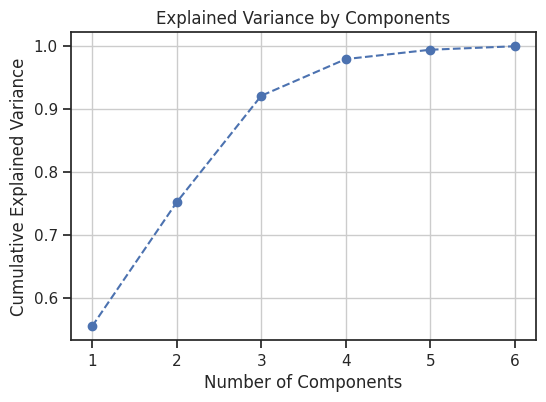

In [58]:
#PCA Continution

# Explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_
print("Explained Variance Ratio:", explained_variance_ratio)

# Cumulative explained variance
cumulative_variance = explained_variance_ratio.cumsum()

# Plotting the explained variance ratio
plt.figure(figsize=(6, 4))
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o', linestyle='--')
plt.title('Explained Variance by Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid(True)
plt.show()

#### Features that start with SOIL*

In [59]:
input[[col for col in x_columns if col.startswith('SOIL')]].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55489 entries, 0 to 55488
Data columns (total 61 columns):
 #   Column                                 Non-Null Count  Dtype
---  ------                                 --------------  -----
 0   SOIL_bdod_0.5cm_mean_0.01_deg          55489 non-null  int64
 1   SOIL_bdod_100.200cm_mean_0.01_deg      55489 non-null  int64
 2   SOIL_bdod_15.30cm_mean_0.01_deg        55489 non-null  int64
 3   SOIL_bdod_30.60cm_mean_0.01_deg        55489 non-null  int64
 4   SOIL_bdod_5.15cm_mean_0.01_deg         55489 non-null  int64
 5   SOIL_bdod_60.100cm_mean_0.01_deg       55489 non-null  int64
 6   SOIL_cec_0.5cm_mean_0.01_deg           55489 non-null  int64
 7   SOIL_cec_100.200cm_mean_0.01_deg       55489 non-null  int64
 8   SOIL_cec_15.30cm_mean_0.01_deg         55489 non-null  int64
 9   SOIL_cec_30.60cm_mean_0.01_deg         55489 non-null  int64
 10  SOIL_cec_5.15cm_mean_0.01_deg          55489 non-null  int64
 11  SOIL_cec_60.100cm_mean_0.01_

In [60]:
#Correlation for soil data
input[[col for col in x_columns if col.startswith('SOIL')]].corr()

,SOIL_bdod_0.5cm_mean_0.01_deg,SOIL_bdod_100.200cm_mean_0.01_deg,SOIL_bdod_15.30cm_mean_0.01_deg,SOIL_bdod_30.60cm_mean_0.01_deg,SOIL_bdod_5.15cm_mean_0.01_deg,SOIL_bdod_60.100cm_mean_0.01_deg,SOIL_cec_0.5cm_mean_0.01_deg,SOIL_cec_100.200cm_mean_0.01_deg,SOIL_cec_15.30cm_mean_0.01_deg,SOIL_cec_30.60cm_mean_0.01_deg,...,SOIL_silt_15.30cm_mean_0.01_deg,SOIL_silt_30.60cm_mean_0.01_deg,SOIL_silt_5.15cm_mean_0.01_deg,SOIL_silt_60.100cm_mean_0.01_deg,SOIL_soc_0.5cm_mean_0.01_deg,SOIL_soc_100.200cm_mean_0.01_deg,SOIL_soc_15.30cm_mean_0.01_deg,SOIL_soc_30.60cm_mean_0.01_deg,SOIL_soc_5.15cm_mean_0.01_deg,SOIL_soc_60.100cm_mean_0.01_deg
SOIL_bdod_0.5cm_mean_0.01_deg,1.000000,0.621600,0.897300,0.773921,0.950027,0.662530,-0.556189,-0.160544,-0.306996,-0.209217,...,-0.184304,-0.185248,-0.176883,-0.183238,-0.765939,-0.534640,-0.659540,-0.588370,-0.767169,-0.539593
SOIL_bdod_100.200cm_mean_0.01_deg,0.621600,1.000000,0.846959,0.958091,0.783875,0.994979,-0.050378,-0.066687,-0.089062,-0.061087,...,0.157982,0.155956,0.167120,0.148394,-0.355300,-0.457612,-0.508816,-0.487813,-0.507674,-0.462828
SOIL_bdod_15.30cm_mean_0.01_deg,0.897300,0.846959,1.000000,0.947428,0.981266,0.874203,-0.365388,-0.128372,-0.248140,-0.165083,...,-0.044276,-0.044897,-0.034179,-0.045338,-0.653473,-0.550066,-0.664835,-0.604368,-0.724770,-0.558628
SOIL_bdod_30.60cm_mean_0.01_deg,0.773921,0.958091,0.947428,1.000000,0.902841,0.973304,-0.215156,-0.104459,-0.179188,-0.122554,...,0.046816,0.045468,0.057216,0.041927,-0.527069,-0.527819,-0.616098,-0.573647,-0.643981,-0.536415
SOIL_bdod_5.15cm_mean_0.01_deg,0.950027,0.783875,0.981266,0.902841,1.000000,0.815947,-0.437343,-0.147481,-0.276418,-0.187588,...,-0.087288,-0.087629,-0.077313,-0.087452,-0.702366,-0.554772,-0.672563,-0.607958,-0.749809,-0.561083
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SOIL_soc_100.200cm_mean_0.01_deg,-0.534640,-0.457612,-0.550066,-0.527819,-0.554772,-0.474613,0.378109,0.230799,0.322208,0.267265,...,0.038830,0.045371,0.032878,0.047191,0.665686,1.000000,0.930557,0.975819,0.814960,0.976816
SOIL_soc_15.30cm_mean_0.01_deg,-0.659540,-0.508816,-0.664835,-0.616098,-0.672563,-0.533328,0.480476,0.219602,0.365111,0.282169,...,0.153869,0.159766,0.147147,0.157816,0.813660,0.930557,1.000000,0.969299,0.931790,0.934276
SOIL_soc_30.60cm_mean_0.01_deg,-0.588370,-0.487813,-0.604368,-0.573647,-0.607958,-0.508113,0.420675,0.223832,0.342572,0.276157,...,0.098824,0.104619,0.092354,0.104805,0.731953,0.975819,0.969299,1.000000,0.869740,0.973928
SOIL_soc_5.15cm_mean_0.01_deg,-0.767169,-0.507674,-0.724770,-0.643981,-0.749809,-0.539286,0.579909,0.203987,0.380829,0.276833,...,0.221981,0.227305,0.214234,0.221459,0.916904,0.814960,0.931790,0.869740,1.000000,0.821955


In [61]:
#PCA for SOIL DATA
soil_columns = []
soil_columns += [col for col in train_csv.columns if col.startswith('SOIL')]
soil_input = X_train[soil_columns]
soil_input.head()
#input[[col for col in x_columns if col.startswith('WORLD')]].describe()


,SOIL_bdod_0.5cm_mean_0.01_deg,SOIL_bdod_100.200cm_mean_0.01_deg,SOIL_bdod_15.30cm_mean_0.01_deg,SOIL_bdod_30.60cm_mean_0.01_deg,SOIL_bdod_5.15cm_mean_0.01_deg,SOIL_bdod_60.100cm_mean_0.01_deg,SOIL_cec_0.5cm_mean_0.01_deg,SOIL_cec_100.200cm_mean_0.01_deg,SOIL_cec_15.30cm_mean_0.01_deg,SOIL_cec_30.60cm_mean_0.01_deg,...,SOIL_silt_15.30cm_mean_0.01_deg,SOIL_silt_30.60cm_mean_0.01_deg,SOIL_silt_5.15cm_mean_0.01_deg,SOIL_silt_60.100cm_mean_0.01_deg,SOIL_soc_0.5cm_mean_0.01_deg,SOIL_soc_100.200cm_mean_0.01_deg,SOIL_soc_15.30cm_mean_0.01_deg,SOIL_soc_30.60cm_mean_0.01_deg,SOIL_soc_5.15cm_mean_0.01_deg,SOIL_soc_60.100cm_mean_0.01_deg
0,125,149,136,145,132,148,228,210,221,212,...,373,359,367,353,312,49,126,94,208,38
1,124,144,138,143,128,142,145,139,149,145,...,317,303,310,292,52,49,33,22,50,20
2,107,133,119,126,114,132,283,254,252,260,...,304,291,306,278,783,288,412,309,504,255
3,120,131,125,131,123,131,234,220,223,214,...,315,293,312,308,473,62,224,97,344,69
4,91,146,120,138,109,143,381,325,352,315,...,376,377,367,353,737,178,331,214,493,222


In [62]:
# Standardize the features
scaler = StandardScaler()
soil_data_input_scaled = scaler.fit_transform(soil_input)

# Instantiate the PCA object
pca = PCA()

# Fit the PCA model to the scaled data
pca.fit(soil_data_input_scaled)

# Transform the data onto the new feature space
soil_data_input_pca = pca.transform(soil_data_input_scaled)

#print("New Data is",soil_data_input_pca)

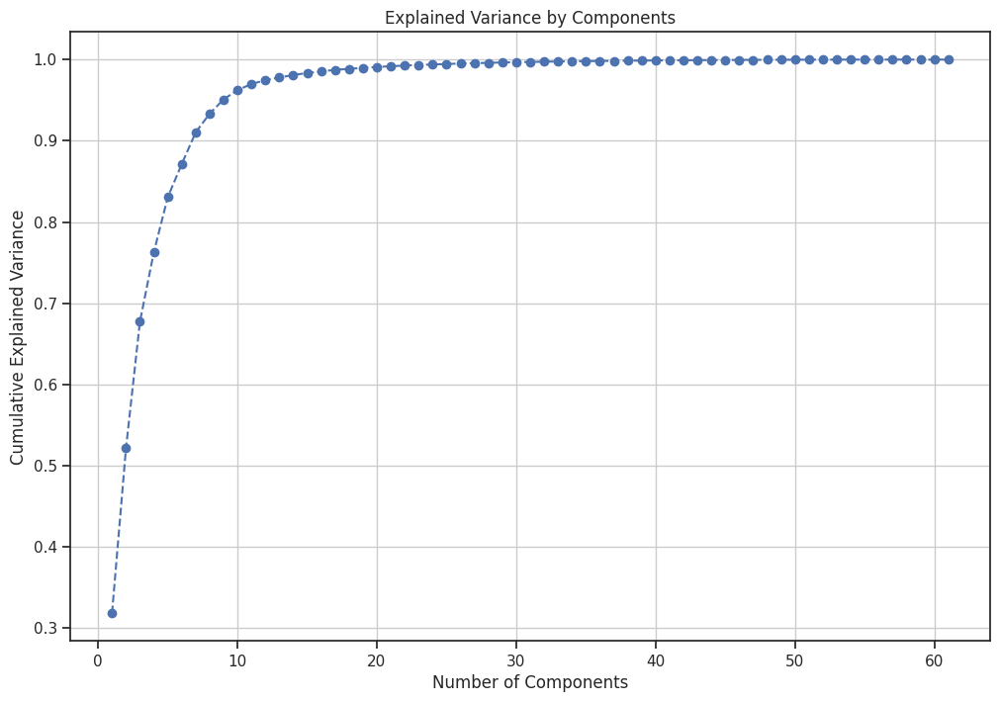

In [63]:
#PCA Continution

# Explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_
#print("Explained Variance Ratio:", explained_variance_ratio)

# Cumulative explained variance
cumulative_variance = explained_variance_ratio.cumsum()

# Plotting the explained variance ratio
plt.figure(figsize=(12, 8))
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o', linestyle='--')
plt.title('Explained Variance by Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid(True)
plt.show()

#### Features that start with MODIS*

In [64]:
#ancillary multitemporal  variables that can be used to faciliate the trait prediction
input[[col for col in x_columns if col.startswith('MODIS_')]].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55489 entries, 0 to 55488
Data columns (total 60 columns):
 #   Column                                                                Non-Null Count  Dtype
---  ------                                                                --------------  -----
 0   MODIS_2000.2020_monthly_mean_surface_reflectance_band_01_._month_m1   55489 non-null  int64
 1   MODIS_2000.2020_monthly_mean_surface_reflectance_band_02_._month_m1   55489 non-null  int64
 2   MODIS_2000.2020_monthly_mean_surface_reflectance_band_03_._month_m1   55489 non-null  int64
 3   MODIS_2000.2020_monthly_mean_surface_reflectance_band_04_._month_m1   55489 non-null  int64
 4   MODIS_2000.2020_monthly_mean_surface_reflectance_band_05_._month_m1   55489 non-null  int64
 5   MODIS_2000.2020_monthly_mean_surface_reflectance_band_01_._month_m10  55489 non-null  int64
 6   MODIS_2000.2020_monthly_mean_surface_reflectance_band_02_._month_m10  55489 non-null  int64
 7   MODIS_2000.20

In [65]:
#PCA for MODIS DATA
modis_columns = []
modis_columns += [col for col in train_csv.columns if col.startswith('MODIS_')]
modis_input = X_train[modis_columns]
modis_input.head()
#input[[col for col in x_columns if col.startswith('WORLD')]].describe()


,MODIS_2000.2020_monthly_mean_surface_reflectance_band_01_._month_m1,MODIS_2000.2020_monthly_mean_surface_reflectance_band_02_._month_m1,MODIS_2000.2020_monthly_mean_surface_reflectance_band_03_._month_m1,MODIS_2000.2020_monthly_mean_surface_reflectance_band_04_._month_m1,MODIS_2000.2020_monthly_mean_surface_reflectance_band_05_._month_m1,MODIS_2000.2020_monthly_mean_surface_reflectance_band_01_._month_m10,MODIS_2000.2020_monthly_mean_surface_reflectance_band_02_._month_m10,MODIS_2000.2020_monthly_mean_surface_reflectance_band_03_._month_m10,MODIS_2000.2020_monthly_mean_surface_reflectance_band_04_._month_m10,MODIS_2000.2020_monthly_mean_surface_reflectance_band_05_._month_m10,...,MODIS_2000.2020_monthly_mean_surface_reflectance_band_01_._month_m8,MODIS_2000.2020_monthly_mean_surface_reflectance_band_02_._month_m8,MODIS_2000.2020_monthly_mean_surface_reflectance_band_03_._month_m8,MODIS_2000.2020_monthly_mean_surface_reflectance_band_04_._month_m8,MODIS_2000.2020_monthly_mean_surface_reflectance_band_05_._month_m8,MODIS_2000.2020_monthly_mean_surface_reflectance_band_01_._month_m9,MODIS_2000.2020_monthly_mean_surface_reflectance_band_02_._month_m9,MODIS_2000.2020_monthly_mean_surface_reflectance_band_03_._month_m9,MODIS_2000.2020_monthly_mean_surface_reflectance_band_04_._month_m9,MODIS_2000.2020_monthly_mean_surface_reflectance_band_05_._month_m9
0,543,943,429,568,1199,657,1088,438,618,1474,...,753,1191,498,690,1552,710,1136,460,646,1514
1,837,920,527,710,977,1111,1218,708,941,1261,...,1193,1299,771,1011,1317,1173,1281,753,993,1311
2,953,3236,519,885,3682,501,4240,294,736,3677,...,475,3838,267,685,3462,492,4051,296,723,3562
3,565,3225,296,661,3379,617,2934,321,648,3299,...,583,2684,289,552,3068,601,2759,299,590,3184
4,3137,3253,3727,3386,2286,838,1678,598,771,1973,...,372,2878,253,524,2703,503,2375,283,573,2504


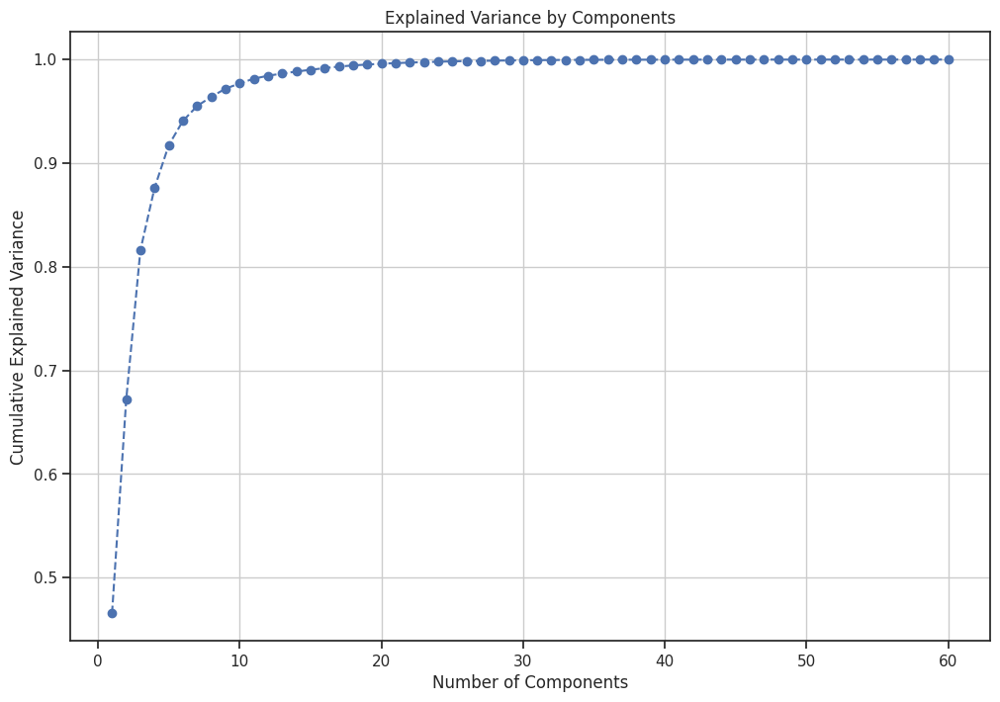

In [66]:
# Standardize the features
scaler = StandardScaler()
modis_data_input_scaled = scaler.fit_transform(modis_input)

# Instantiate the PCA object
pca = PCA()

# Fit the PCA model to the scaled data
pca.fit(modis_data_input_scaled)

# Transform the data onto the new feature space
modis_data_input_pca = pca.transform(modis_data_input_scaled)

#print("New Data is", modis_data_input_pca)
# Explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_
#print("Explained Variance Ratio:", explained_variance_ratio)

# Cumulative explained variance
cumulative_variance = explained_variance_ratio.cumsum()

# Plotting the explained variance ratio
plt.figure(figsize=(12, 8))
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o', linestyle='--')
plt.title('Explained Variance by Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid(True)
plt.show()

#### Features that start with VOD*

In [67]:
#ancillary multitemporal  variables that can be used to faciliate the trait prediction
input[[col for col in x_columns if col.startswith('VOD_')]].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55489 entries, 0 to 55488
Data columns (total 36 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   VOD_C_2002_2018_multiyear_mean_m01   55489 non-null  float64
 1   VOD_C_2002_2018_multiyear_mean_m02   55489 non-null  float64
 2   VOD_C_2002_2018_multiyear_mean_m03   55489 non-null  float64
 3   VOD_C_2002_2018_multiyear_mean_m04   55489 non-null  float64
 4   VOD_C_2002_2018_multiyear_mean_m05   55489 non-null  float64
 5   VOD_C_2002_2018_multiyear_mean_m06   55489 non-null  float64
 6   VOD_C_2002_2018_multiyear_mean_m07   55489 non-null  float64
 7   VOD_C_2002_2018_multiyear_mean_m08   55489 non-null  float64
 8   VOD_C_2002_2018_multiyear_mean_m09   55489 non-null  float64
 9   VOD_C_2002_2018_multiyear_mean_m10   55489 non-null  float64
 10  VOD_C_2002_2018_multiyear_mean_m11   55489 non-null  float64
 11  VOD_C_2002_2018_multiyear_me

In [68]:
#PCA for VOD DATA
vod_columns = []
vod_columns += [col for col in train_csv.columns if col.startswith('VOD_')]
vod_input = X_train[vod_columns]
vod_input.head()
#input[[col for col in x_columns if col.startswith('WORLD')]].describe()

,VOD_C_2002_2018_multiyear_mean_m01,VOD_C_2002_2018_multiyear_mean_m02,VOD_C_2002_2018_multiyear_mean_m03,VOD_C_2002_2018_multiyear_mean_m04,VOD_C_2002_2018_multiyear_mean_m05,VOD_C_2002_2018_multiyear_mean_m06,VOD_C_2002_2018_multiyear_mean_m07,VOD_C_2002_2018_multiyear_mean_m08,VOD_C_2002_2018_multiyear_mean_m09,VOD_C_2002_2018_multiyear_mean_m10,...,VOD_X_1997_2018_multiyear_mean_m03,VOD_X_1997_2018_multiyear_mean_m04,VOD_X_1997_2018_multiyear_mean_m05,VOD_X_1997_2018_multiyear_mean_m06,VOD_X_1997_2018_multiyear_mean_m07,VOD_X_1997_2018_multiyear_mean_m08,VOD_X_1997_2018_multiyear_mean_m09,VOD_X_1997_2018_multiyear_mean_m10,VOD_X_1997_2018_multiyear_mean_m11,VOD_X_1997_2018_multiyear_mean_m12
0,0.338971,0.348590,0.390214,0.419935,0.412300,0.399303,0.381950,0.373861,0.377692,0.407391,...,0.455806,0.506616,0.531718,0.509142,0.444842,0.423471,0.444432,0.472432,0.448272,0.403038
1,0.265089,0.248952,0.228648,0.219438,0.212008,0.200188,0.206500,0.204708,0.206359,0.217578,...,0.277699,0.270621,0.264534,0.244796,0.253600,0.251986,0.261273,0.279112,0.294724,0.311158
2,0.441699,0.428869,0.425790,0.414703,0.412291,0.409913,0.406059,0.413054,0.424531,0.439442,...,0.436853,0.439573,0.446150,0.451612,0.444537,0.434794,0.444734,0.455066,0.458448,0.455440
3,0.340650,0.331080,0.343284,0.334147,0.338084,0.336621,0.345327,0.338007,0.334226,0.335818,...,0.334322,0.328369,0.316033,0.305631,0.321647,0.329818,0.318389,0.350208,0.349995,0.348838
4,0.458608,0.309740,0.354649,0.393623,0.421163,0.537507,0.581277,0.574287,0.521677,0.454662,...,0.358661,0.419538,0.466089,0.562763,0.608216,0.610752,0.565290,0.488996,0.457526,0.448166


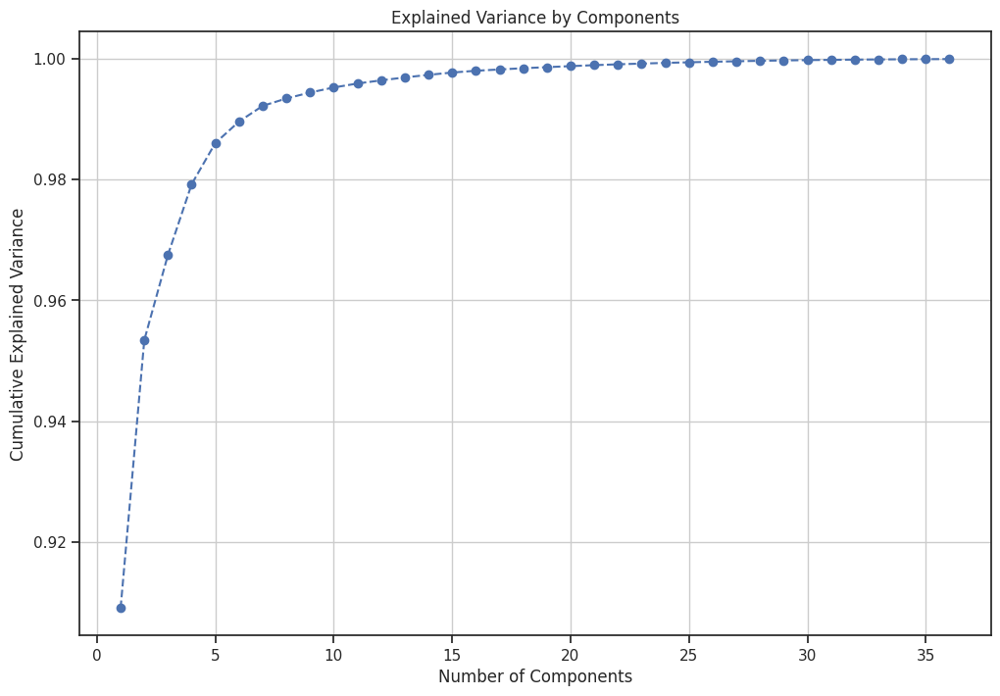

In [69]:
# Standardize the features
scaler = StandardScaler()
vod_data_input_scaled = scaler.fit_transform(vod_input)

# Instantiate the PCA object
pca = PCA()

# Fit the PCA model to the scaled data
pca.fit(vod_data_input_scaled)

# Transform the data onto the new feature space
modis_data_input_pca = pca.transform(vod_data_input_scaled)

#print("New Data is", modis_data_input_pca)
# Explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_
#print("Explained Variance Ratio:", explained_variance_ratio)

# Cumulative explained variance
cumulative_variance = explained_variance_ratio.cumsum()

# Plotting the explained variance ratio
plt.figure(figsize=(12, 8))
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o', linestyle='--')
plt.title('Explained Variance by Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid(True)
plt.show()

In [70]:
# Print the shape of the transformed data
print("Shape of transformed data:", modis_data_input_pca.shape)

Shape of transformed data: (54421, 36)


In [71]:
#PCA for SOIL, MODIS and VOD
smv_columns = []
smv_columns += [col for col in train_csv.columns if (col.startswith('WORLD') or col.startswith('SOIL_') or col.startswith('MODIS_') or col.startswith('VOD_'))]
smv_input = X_train[smv_columns]
smv_input.head()
#input[[col for col in x_columns if col.startswith('WORLD')]].describe()

,WORLDCLIM_BIO1_annual_mean_temperature,WORLDCLIM_BIO12_annual_precipitation,WORLDCLIM_BIO13.BIO14_delta_precipitation_of_wettest_and_dryest_month,WORLDCLIM_BIO15_precipitation_seasonality,WORLDCLIM_BIO4_temperature_seasonality,WORLDCLIM_BIO7_temperature_annual_range,SOIL_bdod_0.5cm_mean_0.01_deg,SOIL_bdod_100.200cm_mean_0.01_deg,SOIL_bdod_15.30cm_mean_0.01_deg,SOIL_bdod_30.60cm_mean_0.01_deg,...,VOD_X_1997_2018_multiyear_mean_m03,VOD_X_1997_2018_multiyear_mean_m04,VOD_X_1997_2018_multiyear_mean_m05,VOD_X_1997_2018_multiyear_mean_m06,VOD_X_1997_2018_multiyear_mean_m07,VOD_X_1997_2018_multiyear_mean_m08,VOD_X_1997_2018_multiyear_mean_m09,VOD_X_1997_2018_multiyear_mean_m10,VOD_X_1997_2018_multiyear_mean_m11,VOD_X_1997_2018_multiyear_mean_m12
0,12.235703,374.466675,62.524445,72.256844,773.592041,33.277779,125,149,136,145,...,0.455806,0.506616,0.531718,0.509142,0.444842,0.423471,0.444432,0.472432,0.448272,0.403038
1,17.270555,90.239998,10.351111,38.220940,859.193298,40.009777,124,144,138,143,...,0.277699,0.270621,0.264534,0.244796,0.253600,0.251986,0.261273,0.279112,0.294724,0.311158
2,14.254504,902.071411,49.642857,17.873655,387.977753,22.807142,107,133,119,126,...,0.436853,0.439573,0.446150,0.451612,0.444537,0.434794,0.444734,0.455066,0.458448,0.455440
3,18.680834,1473.933350,163.100006,45.009758,381.053986,20.436666,120,131,125,131,...,0.334322,0.328369,0.316033,0.305631,0.321647,0.329818,0.318389,0.350208,0.349995,0.348838
4,0.673204,530.088867,50.857777,38.230709,1323.526855,45.891998,91,146,120,138,...,0.358661,0.419538,0.466089,0.562763,0.608216,0.610752,0.565290,0.488996,0.457526,0.448166


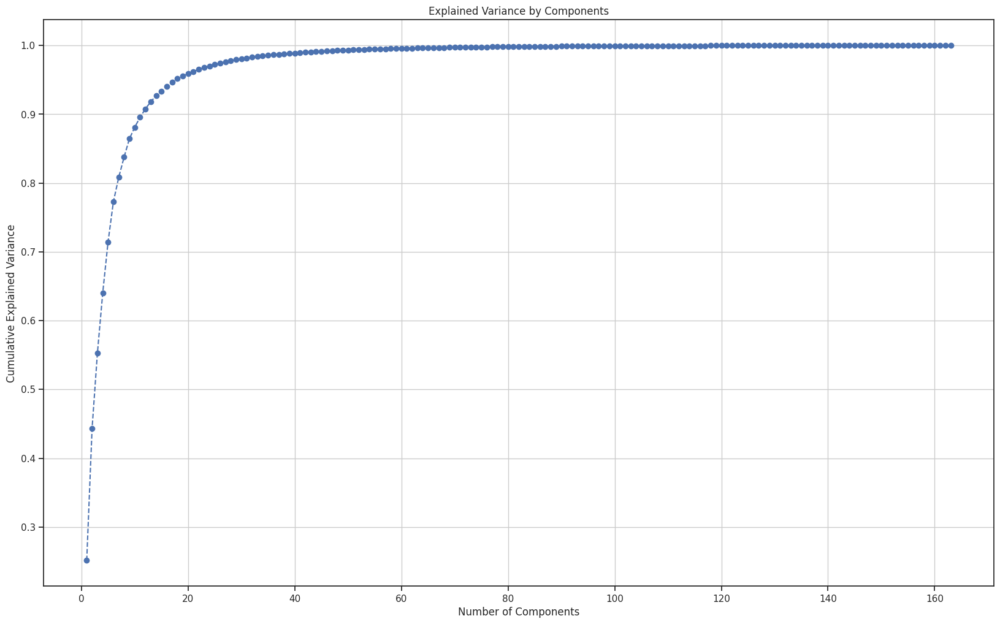

In [72]:
# Standardize the features
scaler = StandardScaler()
smv_data_input_scaled = scaler.fit_transform(smv_input)

# Instantiate the PCA object
pca = PCA()

# Fit the PCA model to the scaled data
pca.fit(smv_data_input_scaled)

# Transform the data onto the new feature space
smv_data_input_pca = pca.transform(smv_data_input_scaled)

#print("New Data is", smv_data_input_pca)

# Explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_
#print("Explained Variance Ratio:", explained_variance_ratio)

# Cumulative explained variance
cumulative_variance = explained_variance_ratio.cumsum()

# Plotting the explained variance ratio
plt.figure(figsize=(20, 12))
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o', linestyle='--')
plt.title('Explained Variance by Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid(True)
plt.show()

In [73]:
smv_data_input_pca

array([[ 2.17726621e+00, -3.90238876e+00,  1.71211606e+00, ...,
        -7.40820885e-04, -1.53337913e-04,  1.31499653e-05],
       [-7.10878025e+00, -2.45110633e+00,  3.40699979e+00, ...,
         2.77118338e-03, -1.60717917e-03, -4.55267083e-03],
       [ 2.73484684e+00,  7.78621481e-01, -2.01109560e+00, ...,
         4.73721798e-03,  2.40979868e-03, -3.55016360e-03],
       ...,
       [-7.64658315e+00, -5.72964252e+00,  3.62180141e+00, ...,
         4.81551910e-04, -1.77586432e-03,  4.38270545e-03],
       [-1.29337325e+00, -3.38951551e+00,  1.77755937e+00, ...,
         3.46035418e-04,  1.06403883e-03,  1.35466797e-04],
       [ 1.26041118e+01, -2.29176165e+00, -9.94859752e+00, ...,
        -1.31720852e-03, -5.60317583e-04, -4.25680965e-04]])

### ML Baseline using only CSV features

In [74]:
#XGBoost
import xgboost
from numpy import absolute
from pandas import read_csv
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
print(xgboost.__version__)

2.0.3


### First using features with >98%variance from PCA on all input features

In [75]:
# Instantiate the PCA object
pca = PCA(n_components = 40)

# Fit the PCA model to the scaled data
pca.fit(smv_data_input_scaled)

columns = ['pca_comp_%i' % i for i in range(40)]
df_pca  = pd.DataFrame(pca.transform(smv_data_input_scaled), columns=columns)
df_pca.head()
# Transform the data onto the new feature space
#smv_data_input_pca = pca.transform(smv_data_input_scaled)

,pca_comp_0,pca_comp_1,pca_comp_2,pca_comp_3,pca_comp_4,pca_comp_5,pca_comp_6,pca_comp_7,pca_comp_8,pca_comp_9,...,pca_comp_30,pca_comp_31,pca_comp_32,pca_comp_33,pca_comp_34,pca_comp_35,pca_comp_36,pca_comp_37,pca_comp_38,pca_comp_39
0,2.177266,-3.902389,1.712116,-4.771062,-7.731520,3.244425,-2.324466,1.825303,1.956952,0.473203,...,0.011072,0.412744,-0.267799,-0.025677,0.320883,0.583699,-0.551568,-0.187568,-0.277857,0.242438
1,-7.108780,-2.451106,3.407000,-6.852617,-7.850326,4.883190,-1.816265,3.578910,-0.062698,0.591020,...,-0.217238,0.278227,0.073144,-0.507385,-0.362750,-0.149131,-0.241430,-0.109622,0.024383,0.367757
2,2.734847,0.778621,-2.011096,2.690205,4.468173,-0.111671,1.597489,-4.969949,-1.437740,-1.954337,...,0.103530,0.055058,0.044527,-0.095892,0.205480,0.282151,0.093851,0.174881,-0.140059,-0.116013
3,-0.881540,-2.885813,-0.706676,2.821821,2.568832,-3.004493,0.508297,-0.407608,0.055606,-1.236260,...,-0.132451,-0.174063,0.266125,-0.519572,-0.332934,-0.001605,-0.113890,0.488467,0.186299,0.155872
4,5.474927,6.397511,3.178067,1.917932,-5.041602,-1.318270,-2.256581,-3.426620,-0.173317,-0.068193,...,0.534478,0.093716,0.443955,-0.361262,0.444257,-0.539972,0.030928,-0.010921,-0.696283,0.021093


In [76]:
df_pca.to_csv("Input_data_preprocessed_all_input.csv")

In [78]:
model = xgboost.XGBRegressor()
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
# evaluate model
scores = cross_val_score(model, df_pca, y_train, scoring='r2', cv=cv, n_jobs=-1)
# force scores to be positive
print('Mean R2: %.3f (%.3f)' % (scores.mean(), scores.std()) )

Mean R2: 0.154 (0.012)


### Using top n features from each group now, each group getting >98% variance

In [79]:
#WORLD*
pca = PCA(n_components = 4)
pca.fit(world_data_input_scaled)

columns = ['pca_comp_world_%i' % i for i in range(4)]
df_pca  = pd.DataFrame(pca.transform(world_data_input_scaled), columns=columns)

#SOIL
pca = PCA(n_components = 20)
pca.fit(soil_data_input_scaled)

columns = ['pca_comp_soil_%i' % i for i in range(20)]
temp1  = pd.DataFrame(pca.transform(soil_data_input_scaled), columns=columns)

df_pca = pd.concat([df_pca, temp1], axis=1)

#MODOS
pca = PCA(n_components = 20)
pca.fit(modis_data_input_scaled)

columns = ['pca_comp_modis_%i' % i for i in range(20)]
temp2  = pd.DataFrame(pca.transform(modis_data_input_scaled), columns=columns)

df_pca = pd.concat([df_pca, temp2], axis=1)

#VOD
pca = PCA(n_components = 20)
pca.fit(vod_data_input_scaled)

columns = ['pca_comp_vod_%i' % i for i in range(20)]
temp3  = pd.DataFrame(pca.transform(vod_data_input_scaled), columns=columns)

df_pca = pd.concat([df_pca, temp3], axis=1)
df_pca.head()

,pca_comp_world_0,pca_comp_world_1,pca_comp_world_2,pca_comp_world_3,pca_comp_soil_0,pca_comp_soil_1,pca_comp_soil_2,pca_comp_soil_3,pca_comp_soil_4,pca_comp_soil_5,...,pca_comp_vod_10,pca_comp_vod_11,pca_comp_vod_12,pca_comp_vod_13,pca_comp_vod_14,pca_comp_vod_15,pca_comp_vod_16,pca_comp_vod_17,pca_comp_vod_18,pca_comp_vod_19
0,-1.419978,0.880396,-0.056625,-0.078997,-2.379414,-2.174315,1.987154,-0.274421,0.743155,-0.957005,...,0.036270,0.010357,0.112950,0.414506,-0.179228,0.054532,0.076578,-0.069286,-0.084392,0.099150
1,-2.126306,0.420813,-0.583928,-1.230554,-6.659848,0.175053,5.064726,0.129738,-1.290985,2.106649,...,-0.124608,-0.102136,-0.027765,0.043251,-0.035336,0.010346,0.108617,0.048718,0.004528,0.058049
2,-0.221041,-1.128359,-0.906175,-0.022949,2.354236,1.447135,0.537139,1.529796,0.681784,-2.073537,...,0.098204,0.083065,-0.027862,0.040849,-0.034867,-0.010811,0.024748,-0.049120,-0.045089,-0.009051
3,0.950363,-0.534849,-0.170298,-0.273685,0.847940,-0.495555,-3.105814,-0.578838,0.598679,-3.110698,...,0.045932,-0.158986,0.078828,-0.095899,0.093132,0.008382,0.041280,0.039679,0.022888,0.102173
4,-3.728853,-0.055966,1.427241,-0.320568,4.347453,-2.915244,3.195349,2.555668,0.444883,-1.073165,...,-0.013905,0.023364,-0.156446,0.207831,-0.135175,0.003335,0.086809,0.223613,-0.006356,0.135891


In [80]:
df_pca.shape

(54421, 64)

In [81]:
df_pca.to_csv("input_data_preprocessed_grouped_input.csv")

In [82]:
y_train.to_csv("output_features.csv")

In [85]:
model = xgboost.XGBRegressor()
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
# evaluate model
scores = cross_val_score(model, df_pca, y_train, scoring='r2', cv=cv, n_jobs=-1)
# force scores to be positive
print('Mean R2: %.3f (%.3f)' % (scores.mean(), scores.std()) )

Mean R2: 0.158 (0.013)


In [ ]:
predictions1 = model.predict(df_pca_test)
predictions_df = pd.DataFrame(predictions1)
predictions_df.head()

### Building an XGBoost model for each output column separately. Thus  models for 6 outputs

In [86]:
model1 = xgboost.XGBRegressor()
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
# evaluate model
scores = cross_val_score(model1, df_pca, y_train['X4_mean'], scoring='r2', cv=cv, n_jobs=-1)
# force scores to be positive
print('Mean R2: %.3f (%.3f)' % (scores.mean(), scores.std()) )

model2 = xgboost.XGBRegressor()
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
# evaluate model
scores = cross_val_score(model2, df_pca, y_train['X11_mean'], scoring='r2', cv=cv, n_jobs=-1)
# force scores to be positive
print('Mean R2: %.3f (%.3f)' % (scores.mean(), scores.std()) )

model3 = xgboost.XGBRegressor()
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
# evaluate model
scores = cross_val_score(model3, df_pca, y_train['X18_mean'], scoring='r2', cv=cv, n_jobs=-1)
# force scores to be positive
print('Mean R2: %.3f (%.3f)' % (scores.mean(), scores.std()) )

model4 = xgboost.XGBRegressor()
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
# evaluate model
scores = cross_val_score(model4, df_pca, y_train['X26_mean'], scoring='r2', cv=cv, n_jobs=-1)
# force scores to be positive
print('Mean R2: %.3f (%.3f)' % (scores.mean(), scores.std()) )

model5 = xgboost.XGBRegressor()
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
# evaluate model
scores = cross_val_score(model5, df_pca, y_train['X50_mean'], scoring='r2', cv=cv, n_jobs=-1)
# force scores to be positive
print('Mean R2: %.3f (%.3f)' % (scores.mean(), scores.std()) )

model6 = xgboost.XGBRegressor()
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
# evaluate model
scores = cross_val_score(model6, df_pca, y_train['X3112_mean'], scoring='r2', cv=cv, n_jobs=-1)
# force scores to be positive
print('Mean R2: %.3f (%.3f)' % (scores.mean(), scores.std()) )

Mean R2: 0.207 (0.013)
Mean R2: 0.176 (0.016)
Mean R2: 0.234 (0.021)
Mean R2: -0.018 (0.057)
Mean R2: 0.120 (0.016)
Mean R2: 0.221 (0.019)


### Building an MLP model for each output column separately. Thus  models for 6 outputs

In [87]:
import keras

def create_model():
    model = keras.models.Sequential([
      keras.layers.Dense(128, activation='relu', kernel_initializer='normal',input_shape=(64,)),
      keras.layers.Dropout(0.2),
      keras.layers.Dense(64, activation='relu',kernel_initializer='normal'),
      keras.layers.Dropout(0.2),
        keras.layers.Dense(32, activation='relu',kernel_initializer='normal'),
      keras.layers.Dropout(0.2),
      keras.layers.Dense(1)
    ])
    #print(model.summary())
    model.compile(optimizer='adam',
      loss=keras.losses.MeanSquaredError(
        reduction="sum_over_batch_size", name="mean_absolute_error"
    ),
      metrics=[keras.metrics.R2Score(
        class_aggregation="uniform_average", num_regressors=0, name="r2_score", dtype=None
    )])
    return model


#model.fit(df_pca, y_train['X4_mean'], epochs=50)
model1 = create_model()
model1.fit(df_pca, y_train['X4_mean'], epochs=40,verbose=0)
# evaluate model
pred = model1.predict(df_pca)
predictions_df = pd.DataFrame(pred)
y_train['X4_mean'] = y_train['X4_mean'].astype(np.float32)
metric = keras.metrics.R2Score()
metric.update_state(y_train['X4_mean'], pred)
result = metric.result()
# force scores to be positive
print('model1 - Mean R2: %.3f ' % (result))

model2 = create_model()
model1.fit(df_pca, y_train['X11_mean'], epochs=40,verbose=0)
# evaluate model
pred = model1.predict(df_pca)
predictions_df = pd.DataFrame(pred)
y_train['X11_mean'] = y_train['X11_mean'].astype(np.float32)
metric = keras.metrics.R2Score()
metric.update_state(y_train['X11_mean'], pred)
result = metric.result()
# force scores to be positive
print('model2 - Mean R2: %.3f ' % (result))

model3 = create_model()
model3.fit(df_pca, y_train['X18_mean'], epochs=40,verbose=0)
# evaluate model
pred = model3.predict(df_pca)
predictions_df = pd.DataFrame(pred)
y_train['X18_mean'] = y_train['X18_mean'].astype(np.float32)
metric = keras.metrics.R2Score()
metric.update_state(y_train['X18_mean'], pred)
result = metric.result()
# force scores to be positive
print('model3- Mean R2: %.3f ' % (result))

model4 = create_model()
model4.fit(df_pca, y_train['X26_mean'], epochs=40,verbose=0)
# evaluate model
pred = model4.predict(df_pca)
predictions_df = pd.DataFrame(pred)
y_train['X26_mean'] = y_train['X26_mean'].astype(np.float32)
metric = keras.metrics.R2Score()
metric.update_state(y_train['X26_mean'], pred)
result = metric.result()
# force scores to be positive
print('model4 - Mean R2: %.3f ' % (result))

model5 = create_model()
model5.fit(df_pca, y_train['X50_mean'], epochs=40,verbose=0)
# evaluate model
pred = model5.predict(df_pca)
predictions_df = pd.DataFrame(pred)
y_train['X50_mean'] = y_train['X50_mean'].astype(np.float32)
metric = keras.metrics.R2Score()
metric.update_state(y_train['X50_mean'], pred)
result = metric.result()
# force scores to be positive
print('model5 - Mean R2: %.3f ' % (result))

model6 = create_model()
model6.fit(df_pca, y_train['X3112_mean'], epochs=40,verbose=0)
# evaluate model
pred = model6.predict(df_pca)
predictions_df = pd.DataFrame(pred)
y_train['X3112_mean'] = y_train['X3112_mean'].astype(np.float32)
metric = keras.metrics.R2Score()
metric.update_state(y_train['X3112_mean'], pred)
result = metric.result()
# force scores to be positive
print('model6 - Mean R2: %.3f ' % (result))



/opt/conda/lib/python3.10/site-packages/keras/src/layers/core/dense.py:85: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1701/1701 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step


/tmp/ipykernel_33/2305272913.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_train['X4_mean'] = y_train['X4_mean'].astype(np.float32)
/opt/conda/lib/python3.10/site-packages/keras/src/layers/core/dense.py:85: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


model1 - Mean R2: 0.271 
1701/1701 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step


/tmp/ipykernel_33/2305272913.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_train['X11_mean'] = y_train['X11_mean'].astype(np.float32)
/opt/conda/lib/python3.10/site-packages/keras/src/layers/core/dense.py:85: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


model2 - Mean R2: 0.265 
1701/1701 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step


/tmp/ipykernel_33/2305272913.py:54: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_train['X18_mean'] = y_train['X18_mean'].astype(np.float32)
/opt/conda/lib/python3.10/site-packages/keras/src/layers/core/dense.py:85: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


model3- Mean R2: 0.358 
1701/1701 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step


/tmp/ipykernel_33/2305272913.py:66: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_train['X26_mean'] = y_train['X26_mean'].astype(np.float32)
/opt/conda/lib/python3.10/site-packages/keras/src/layers/core/dense.py:85: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


model4 - Mean R2: 0.217 
1701/1701 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step


/tmp/ipykernel_33/2305272913.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_train['X50_mean'] = y_train['X50_mean'].astype(np.float32)
/opt/conda/lib/python3.10/site-packages/keras/src/layers/core/dense.py:85: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


model5 - Mean R2: 0.219 
1701/1701 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
model6 - Mean R2: 0.256 


/tmp/ipykernel_33/2305272913.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_train['X3112_mean'] = y_train['X3112_mean'].astype(np.float32)


In [ ]:
#This is for Test data
scaler = StandardScaler()

world_columns += [col for col in train_csv.columns if col.startswith('WORLD')]
world_input = X_test[world_columns]
world_data_input_scaled = scaler.fit_transform(world_input)

soil_columns = []
soil_columns += [col for col in train_csv.columns if col.startswith('SOIL')]
soil_input = X_test[soil_columns]
soil_data_input_scaled = scaler.fit_transform(soil_input)

modis_columns = []
modis_columns += [col for col in train_csv.columns if col.startswith('MODIS_')]
modis_input = X_test[modis_columns]
modis_data_input_scaled = scaler.fit_transform(modis_input)

vod_columns = []
vod_columns += [col for col in train_csv.columns if col.startswith('VOD_')]
vod_input = X_test[vod_columns]
vod_data_input_scaled = scaler.fit_transform(vod_input)


pca = PCA(n_components = 4)
pca.fit(world_data_input_scaled)

columns = ['pca_comp_world_%i' % i for i in range(4)]
df_pca_test  = pd.DataFrame(pca.transform(world_data_input_scaled), columns=columns)

#SOIL
pca = PCA(n_components = 20)
pca.fit(soil_data_input_scaled)

columns = ['pca_comp_soil_%i' % i for i in range(20)]
temp1  = pd.DataFrame(pca.transform(soil_data_input_scaled), columns=columns)

df_pca_test = pd.concat([df_pca_test, temp1], axis=1)

#MODOS
pca = PCA(n_components = 20)
pca.fit(modis_data_input_scaled)

columns = ['pca_comp_modis_%i' % i for i in range(20)]
temp2  = pd.DataFrame(pca.transform(modis_data_input_scaled), columns=columns)

df_pca_test = pd.concat([df_pca_test, temp2], axis=1)

#VOD
pca = PCA(n_components = 20)
pca.fit(vod_data_input_scaled)

columns = ['pca_comp_vod_%i' % i for i in range(20)]
temp3  = pd.DataFrame(pca.transform(vod_data_input_scaled), columns=columns)

df_pca_test = pd.concat([df_pca_test, temp3], axis=1)
df_pca_test.head()

In [ ]:
model1.fit(df_pca, y_train['X4_mean'])
model2.fit(df_pca, y_train['X11_mean'])
model3.fit(df_pca, y_train['X18_mean'])
model4.fit(df_pca, y_train['X26_mean'])
model5.fit(df_pca, y_train['X50_mean'])
model6.fit(df_pca, y_train['X3112_mean'])

predictions1 = model1.predict(df_pca_test)
predictions2 = model2.predict(df_pca_test)
predictions3 = model3.predict(df_pca_test)
predictions4 = model4.predict(df_pca_test)
predictions5 = model5.predict(df_pca_test)
predictions6 = model6.predict(df_pca_test)

predictions_df = pd.DataFrame(predictions1)
predictions_df.rename(columns={0: 'X4'},inplace=True)

temp = pd.DataFrame(predictions2)
predictions_df = pd.concat([predictions_df, temp], axis=1)
predictions_df.rename(columns={0: 'X11'},inplace=True)

temp = pd.DataFrame(predictions3)
predictions_df = pd.concat([predictions_df, temp], axis=1)
predictions_df.rename(columns={0: 'X18'},inplace=True)
temp = pd.DataFrame(predictions4)
predictions_df = pd.concat([predictions_df, temp], axis=1)
predictions_df.rename(columns={0: 'X26'},inplace=True)

temp = pd.DataFrame(predictions5)
predictions_df = pd.concat([predictions_df, temp], axis=1)
predictions_df.rename(columns={0: 'X50'},inplace=True)
temp = pd.DataFrame(predictions6)
predictions_df = pd.concat([predictions_df, temp], axis=1)
predictions_df.rename(columns={0: 'X3112'},inplace=True)
predictions_df['id'] = test_csv.id
predictions_df.head()

In [ ]:
predictions_df = predictions_df[["id",'X4', 'X11', 'X18','X26', 'X50','X3112']]
predictions_df.head()

In [ ]:
predictions_df.rename(columns={0: 'X4', 1: 'X11',2:'X18',3:'X26',4:'X50',5:'X3112'},inplace=True)
predictions_df.head()

In [ ]:
predictions_df.to_csv('/kaggle/working/submission3.csv', index=False)

## For image data
For the final model we use the image data set to train a CNN model to predict all 6 output variables

In [88]:
#Get the number of train and test images
import fnmatch
train_img_dir = '/kaggle/input/planttraits2024/train_images/'
test_img_dir = '/kaggle/input/planttraits2024/test_images/'

print("Training images: ",len(fnmatch.filter(os.listdir(train_img_dir), '*.jpeg')))
print("Testing images: ",len(fnmatch.filter(os.listdir(test_img_dir), '*.jpeg')))

Training images:  55489
Testing images:  7133


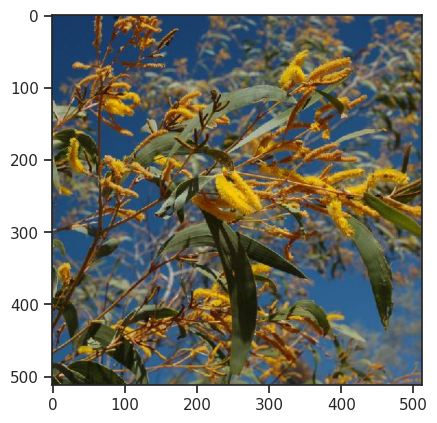

In [89]:
#Print a sample train image

random_image = random.choice([x for x in os.listdir(train_img_dir)
               if os.path.isfile(os.path.join(train_img_dir, x))])
img_name = train_img_dir+random_image
img = mpimg.imread(img_name)
imgplot = plt.imshow(img)
plt.show()

In [90]:
#image shape
img.shape

(512, 512, 3)

In [95]:
import os
import cv2
import numpy as np

root_path = r"/kaggle/input/planttraits2024/"

# Initialize empty lists to store the information
sizes = []
resolutions = []
color_distributions = []
images = []
# Iterate over each image file in each subdirectory
for dirpath, dirnames, filenames in os.walk(root_path):
    for filename in filenames:
        if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
            # Load the image file using OpenCV
            img_path = os.path.join(dirpath, filename)
            img = cv2.imread(img_path)
            images.append(img)
            # Extract the resolution of the image
            resolution = img.shape[:2]
            resolutions.append(resolution)

            # Extract the color distribution of the image
            color_distribution = np.bincount(img.flatten(), minlength=256)
            color_distributions.append(color_distribution)

# Convert the lists to numpy arrays for easier manipulation
sizes = np.array(sizes)
resolutions = np.array(resolutions)
color_distributions = np.array(color_distributions)

KeyboardInterrupt: 

In [94]:
#Check if all images have the same shape or there are images with different shapes
plt.scatter(resolutions[:, 0], resolutions[:, 1])
plt.title("Distribution of Image Resolutions")
plt.xlabel("Width (pixels)")
plt.ylabel("Height (pixels)")
plt.show()

IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

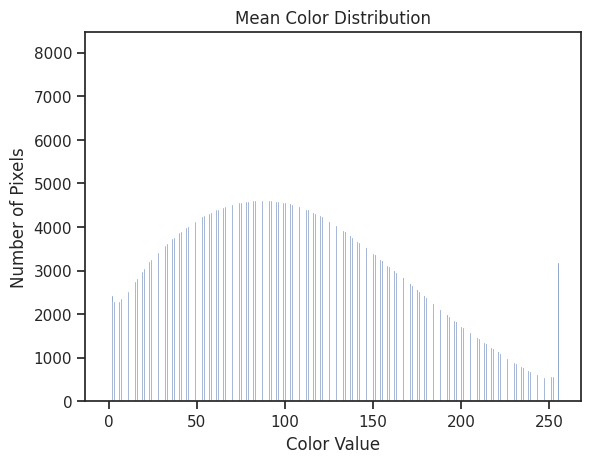

In [96]:
import matplotlib.pyplot as plt

# Calculate the mean color distribution across all images
mean_color_distribution = np.mean(color_distributions, axis=0)

# Plot a bar chart of the mean color distribution
plt.bar(np.arange(256), mean_color_distribution)
plt.title("Mean Color Distribution")
plt.xlabel("Color Value")
plt.ylabel("Number of Pixels")
plt.show()

In [97]:
train_csv['image_path'] = f'/kaggle/input/planttraits2024/train_images/'+train_csv['id'].astype(str)+'.jpeg'
target_name = pd.read_csv("/kaggle/input/planttraits2024/target_name_meta.tsv", delimiter='\t')

#only the output targets to be predicted
y_columns = ['id', 'image_path']
y_columns += [col for col in train_csv.columns if col.endswith('_mean')]

target = train_csv[y_columns]

In [98]:
x_columns = [col for col in train_csv.columns if not col.endswith('_mean')]
x_columns.remove('id')
x_columns = x_columns[:-6]
y_cols = [col for col in train_csv.columns if col.endswith('_mean')]

#Remove rows with basic outliers
#train = train_csv[(train_csv['X4_mean']>0)&(train_csv['X11_mean']<=100)& (train_csv['X18_mean'] < 100) & (train_csv['X26_mean'] < 5000) & (train_csv['X50_mean'] < 10) & (train_csv['X3112_mean']<21000)]
train = train_csv
image_paths = train['image_path']
X_train = train[x_columns]
y_train = train[y_cols]
X_test = test_csv.copy()
X_test.drop(['id'],axis=1,inplace=True)

In [99]:
train.head()

,id,WORLDCLIM_BIO1_annual_mean_temperature,WORLDCLIM_BIO12_annual_precipitation,WORLDCLIM_BIO13.BIO14_delta_precipitation_of_wettest_and_dryest_month,WORLDCLIM_BIO15_precipitation_seasonality,WORLDCLIM_BIO4_temperature_seasonality,WORLDCLIM_BIO7_temperature_annual_range,SOIL_bdod_0.5cm_mean_0.01_deg,SOIL_bdod_100.200cm_mean_0.01_deg,SOIL_bdod_15.30cm_mean_0.01_deg,...,X26_mean,X50_mean,X3112_mean,X4_sd,X11_sd,X18_sd,X26_sd,X50_sd,X3112_sd,image_path
0,192027691,12.235703,374.466675,62.524445,72.256844,773.592041,33.277779,125,149,136,...,1.243779,1.849375,50.216034,0.008921,1.601473,0.025441,0.153608,0.279610,15.045054,/kaggle/input/planttraits2024/train_images/192...
1,195542235,17.270555,90.239998,10.351111,38.220940,859.193298,40.009777,124,144,138,...,0.642940,1.353468,574.098472,0.003102,0.258078,0.000866,0.034630,0.010165,11.004477,/kaggle/input/planttraits2024/train_images/195...
2,196639184,14.254504,902.071411,49.642857,17.873655,387.977753,22.807142,107,133,119,...,0.395241,2.343153,1130.096731,NaN,NaN,NaN,NaN,NaN,NaN,/kaggle/input/planttraits2024/train_images/196...
3,195728812,18.680834,1473.933350,163.100006,45.009758,381.053986,20.436666,120,131,125,...,0.154200,1.155308,1042.686546,0.011692,2.818356,0.110673,0.011334,0.229224,141.857187,/kaggle/input/planttraits2024/train_images/195...
4,195251545,0.673204,530.088867,50.857777,38.230709,1323.526855,45.891998,91,146,120,...,10.919966,2.246226,2386.467180,0.006157,1.128000,0.026996,0.553815,0.107092,87.146899,/kaggle/input/planttraits2024/train_images/195...


In [100]:
image_filenames = train['image_path'].tolist()
regression_labels = train[['X4_mean', 'X11_mean', 'X18_mean', 'X26_mean', 'X50_mean', 'X3112_mean']].values.astype('float32')

In [101]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

image_size = (512, 512)  # Adjust image size based on your data
batch_size = 32
epochs = 10

train_label_df = train_csv[['image_path','X4_mean', 'X11_mean', 'X18_mean', 'X26_mean', 'X50_mean', 'X3112_mean']]
#train_label_df['id'] = train_label_df['id'].apply(str)
print(train_label_df.dtypes)
train_datagen = ImageDataGenerator(rescale=1./255, shear_range=0.2, zoom_range=0.2, horizontal_flip=True)
train_generator = train_datagen.flow_from_dataframe(dataframe=train_label_df, directory=train_img_dir, 
                                              x_col="image_path", y_col=['X4_mean', 'X11_mean', 'X18_mean', 'X26_mean', 'X50_mean', 'X3112_mean'], has_ext=True, 
                                              class_mode="other", target_size=image_size, 
                                              batch_size=batch_size)

image_path     object
X4_mean       float64
X11_mean      float64
X18_mean      float64
X26_mean      float64
X50_mean      float64
X3112_mean    float64
dtype: object
Found 55489 validated image filenames.


In [44]:
for i,j in train_generator:
    print(i.shape)
    print(j.shape)
    break

(32, 512, 512, 3)
(32, 6)


In [10]:
from keras import Input, Model
from keras.layers import Dense, Conv2D, MaxPooling2D, BatchNormalization, Activation, Dropout, Flatten
from keras.optimizers import Adam
import keras
import numpy as np

height = 512
width = 512
depth = 3
chanDim = -1
inputShape = (height, width, depth)
inputs = Input(shape=inputShape,batch_size=64)
filters = [16, 32, 64]
for (i, f) in enumerate(filters):
    # if this is the first CONV layer then set the input
    # appropriately
    if i == 0:
        x = inputs
    # CONV => RELU => BN => POOL
    x = Conv2D(f, (3, 3), padding="same")(x)
    x = Activation("relu")(x)
    x = BatchNormalization(axis=chanDim)(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)

x = Flatten()(x)
x = Dense(16)(x)
x = Activation("relu")(x)
x = BatchNormalization(axis=chanDim)(x)
x = Dropout(0.5)(x)
# apply another FC layer, this one to match the number of nodes
# coming out of the MLP
x = Dense(6, activation="linear")(x)
model = Model(inputs, x)
#print(model.summary())
opt = Adam(learning_rate=1e-3)
model.compile(loss="mean_absolute_error", optimizer=opt, metrics=[r_square])
print(tf.test.gpu_device_name())
callback = keras.callbacks.EarlyStopping(monitor='loss',patience=1,restore_best_weights=True)
with tf.device("GPU:0"):
    model.fit_generator(train_generator,steps_per_epoch=train_generator.n/train_generator.batch_size,epochs=15,callbacks=[callback])
#model.save("model.keras")
model.save_weights('./checkpoints3/my_checkpoint')

/opt/conda/lib/python3.10/site-packages/keras/src/optimizers/base_optimizer.py:34: UserWarning: Argument `decay` is no longer supported and will be ignored.
  warnings.warn(


Epoch 1/20


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


   3/1735 ━━━━━━━━━━━━━━━━━━━━ 4:10:38 9s/step - loss: 46612.9297 - r2_score: -7.8630

KeyboardInterrupt: 

The CNN model was rub on the ARC cluster of CSC department. The model was run for 6 epochs (~6 hrs) and gave an R2 score of -1.4 on the test dataset. This was our best performance

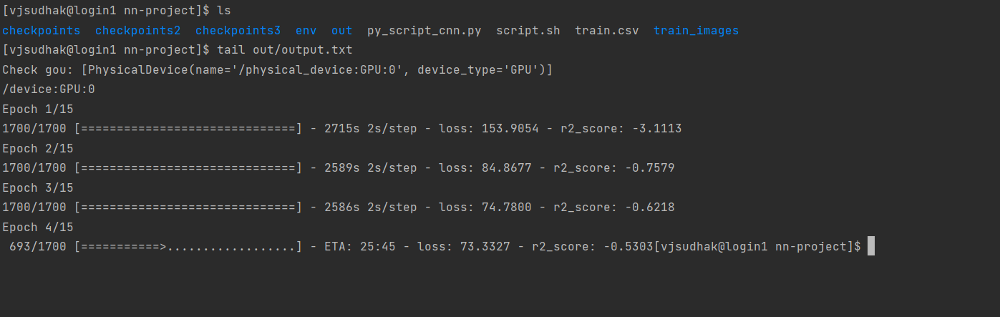

In [7]:
test_csv['image_path'] = test_img_dir+test_csv['id'].astype(str)+'.jpeg'

#only the output targets to be predicted
y_columns = ['image_path']
#Remove rows with basic outliers
test = test_csv[y_columns]
test.head()

,image_path
0,/kaggle/input/planttraits2024/test_images/2012...
1,/kaggle/input/planttraits2024/test_images/2023...
2,/kaggle/input/planttraits2024/test_images/2026...
3,/kaggle/input/planttraits2024/test_images/2013...
4,/kaggle/input/planttraits2024/test_images/1953...


In [8]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
image_size = (512, 512)  # Adjust image size based on your data
batch_size = 32

test_datagen = ImageDataGenerator(rescale=1 / 255.0)
test_generator = test_datagen.flow_from_dataframe(
    dataframe=test,
    directory=test_img_dir,
    x_col="image_path",
    target_size=image_size,
    batch_size=batch_size,
    class_mode=None,
    shuffle=False,
)

2024-04-26 21:47:08.422685: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-26 21:47:08.422879: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-26 21:47:08.616465: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Found 6545 validated image filenames.


In [ ]:
model.load_weights('./checkpoints2/my_checkpoint')

# Evaluate the model
res = model.predict(test_generator)
result = pd.DataFrame(res)
result.rename(columns={0: 'X4', 1: 'X11',2:'X18',3:'X26',4:'X50',5:'X3112'},inplace=True)
result['id'] = test_csv['id']
result = result[["id",'X4', 'X11', 'X18','X26', 'X50','X3112']]
result.to_csv('submission_images_1.csv', index=False)
result.head()

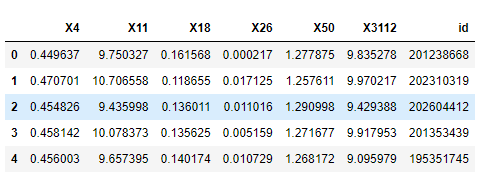